<a href="https://colab.research.google.com/github/MauricioViera95/Sensores_Remotos/blob/main/Caso_practico_Sentinel2_El_Altar_parte_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Ahora se procede a realizar una clasificación supervisada mediante KNN en base a las muetras que posee el archivo vector.

In [ ]:
# Bibliotecas de Python
import geopandas as gpd
import numpy as np
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
import matplotlib.pyplot as plt
from rasterio.plot import show
from sklearn.neighbors import KNeighborsClassifier

# Lectura de los archivos raster y vector
raster_fn = '../data/raw_data/Sentinel2_Altar.tif'
vector_fn = '../data/raw_data/vector_altar/coberturas_muestras.shp'

In [ ]:
# Cargar el vector de muestras
muestras = gpd.read_file(vector_fn)

# Leer la imagen raster
with rasterio.open(raster_fn) as src:
    d = src.count  # Número de bandas

nodata = -255  # Valor para nodata

In [ ]:
# Obtener las clases únicas del vector de muestras y ordenarlas
clases = list(set(muestras['cobertura']))
clases.sort()
clase_dict = {clase: i for i, clase in enumerate(clases)}

In [ ]:
# Inicializar arrays para los datos y sus etiquetas
X = np.zeros([0, d], dtype=np.float32)  # Array para atributos
Y = np.zeros([0], dtype=int)            # Array para etiquetas

In [ ]:
# Extraer los píxeles de las muestras del raster
with rasterio.open(raster_fn) as src:
    for index, row in muestras.iterrows():
        geom = row['geometry']
        clase = row['cobertura']
        geom_gj = [mapping(geom)]  # Convertir a formato GeoJSON

        # Extraer la región de interés (ROI) del raster
        clip, _ = mask(src, geom_gj, crop=True, nodata=nodata)
        d, x, y = clip.shape  # Dimensiones del ROI

        # Reestructurar el ROI en un array bidimensional (d * píxeles)
        D = list(clip.reshape([d, x * y]).T)
        D = [p for p in D if not (p == nodata).all()]  # Filtrar nodata

        DX = np.array(D)  # Atributos
        DY = np.repeat(clase_dict[clase], len(D))  # Etiquetas

        # Concatenar los datos extraídos con los arrays globales
        X = np.concatenate((X, DX))
        Y = np.concatenate((Y, DY))

In [ ]:
# Entrenar el clasificador KNN
knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(X, Y)

KNeighborsClassifier(n_neighbors=2)

In [ ]:
# Leer la imagen completa para la clasificación
with rasterio.open(raster_fn) as src:
    img = src.read()  # Leer todas las bandas
    crs = src.crs  # Sistema de referencia espacial
    gt = src.transform  # Transformación geoespacial

# Reestructurar la imagen para la predicción
d, x, y = img.shape
X_full = img.reshape([d, x * y]).T

In [ ]:
# Realizar la predicción sobre la imagen completa
Y_pred = knn.predict(X_full)

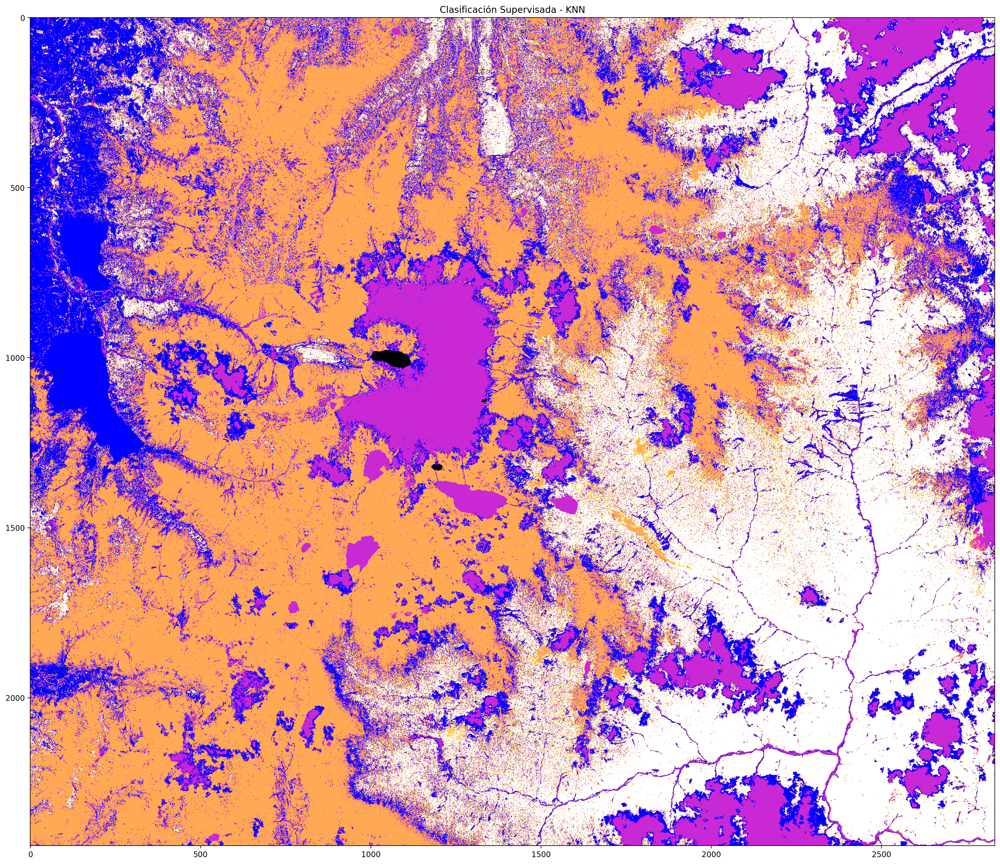

In [ ]:
# Visualización del resultado
plt.figure(figsize=(26, 20), dpi=200)
plt.imshow(Y_pred.reshape([x, y]), cmap='gnuplot2')
plt.title("Clasificación Supervisada - KNN")
plt.show()